<a href="https://colab.research.google.com/github/LSSTISSC/Tidalsaurus/blob/main/notebooks/HSC_Self_Supervised.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Contrastive Learning on HSC images

Author: [@EiffL](https://github.com/EiffL) (Francois Lanusse)

In this notebook, we will demonstrate the use of a simple contrastive learning strategy ( [SimSiam, Chen & He, 2020](https://arxiv.org/abs/2011.10566)) to build a self-supervised representation for HSC images.

Relevant papers:
- Exploring Simple Siamese Representation Learning https://arxiv.org/abs/2011.10566
- Self-Supervised Representation Learning for Astronomical Images https://arxiv.org/abs/2012.13083

Relevant material:
- Keras example for SSL: https://keras.io/examples/vision/simsiam/


In [ ]:
#Setting up a Google Cloud Bucket
from google.colab import auth
auth.authenticate_user()

bucket_name='ml22'

In [1]:
# Retrieving pre-prepared data, it takes 15 minutes.
# Dataset of 50000
#!gsutil -m -q cp -r gs://ml22/hsc_photoz_v2/tensorflow_datasets /root/ 
!gsutil -m -q cp -r gs://ml22/hsc_photoz_v4/tensorflow_datasets /root

#Dataset of 192 galaxies with tidal features
!gsutil -m -q cp -r gs://ml22/hsc_tidal/tensorflow_datasets /root/ 


In [2]:
# Retrieving utilities
!git clone https://github.com/alidez/Tutorials.git

Cloning into 'Tutorials'...
remote: Enumerating objects: 327, done.
remote: Counting objects: 100% (270/270), done.
remote: Compressing objects: 100% (261/261), done.
remote: Total 327 (delta 147), reused 9 (delta 4), pack-reused 57
Receiving objects: 100% (327/327), 12.07 MiB | 8.21 MiB/s, done.
Resolving deltas: 100% (163/163), done.


In [3]:
# Install dependencies
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 6.9 MB/s 


#### Checking for GPU

In [4]:
import tensorflow as tf

#Checking for GPU access
if tf.test.gpu_device_name() != '/device:GPU:0':
  print('WARNING: GPU device not found.')
else:
  print('SUCCESS: Found GPU: {}'.format(tf.test.gpu_device_name()))

SUCCESS: Found GPU: /device:GPU:0


##### Checking how much GPU ram has been used/is available

In [ ]:
# memory footprint support libraries/code
#!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
#!pip install gputil
#!pip install psutil
#!pip install humanize    
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn't guaranteed
gpu = GPUs[0]

def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " I Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print('GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB'.format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

printm()

## Loading dataset

In [5]:
%cd /content/Tutorials/PhotozCNN
import tensorflow_datasets as tfds
import hsc_photoz
import hsc_comb

#!rm -rf /root/tensorflow_datasets
#hsc_dset = tfds.load('hsc_photoz', split='train')
hsc_dset = tfds.load('hsc_comb', split='train')


/content/Tutorials/PhotozCNN


In [6]:
import hsc_tidal
Tidal_dset = tfds.load('hsc_tidal', split='train')

In [ ]:
# Copying prepared data to cloud.
#!gsutil -m -q cp -r /root/tensorflow_datasets/ gs://ml22/hsc_photoz_v4/tensorflow_datasets

In [7]:
#Make list of 189 object_ids of interest
int_ids = []
for entry in Tidal_dset:
  int_ids.append(entry['object_id'])


In [ ]:
titles = ['original','gaussian blur on i_band \nsigma = 1.13, filter size = 5x5']
plt.figure(figsize=(10,10))
for i, entry in enumerate(imgs_blur):
  plt.subplot(1,2,i+1)
  print(shape(entry))
  plt.imshow(luptonize(entry))
  #plt.title('ID = %d'%entry['object_id'])
  plt.title(titles[i])
  plt.axis('off')

NameError: ignored

#### Find where the interesting 189 objects are in hsc_dset

In [ ]:
%cd /content
# Find where in hsc_dset the galaxies of interest are
int_inds2 = []
for i, entry in enumerate(hsc_dset):
  if entry['object_id'] in int_ids:
    int_inds2.append(i)
print(len(int_inds2))

#Save the array of interesting indices
from numpy import asarray
from numpy import savetxt
# define data
data = asarray(int_inds2)
# save to csv file
savetxt('int_inds.csv2', data, delimiter=',')


#### OR load array of indices where interesting 189 objects are in hsc-dset

In [8]:
# load numpy array from csv file
from numpy import loadtxt
!gsutil cp -r gs://ml22/int_inds2.csv /content
# load array
int_inds = loadtxt('/content/int_inds2.csv', delimiter=',')
# print the array
#for ind in int_inds:
#  print(int(ind))

Copying gs://ml22/int_inds2.csv...
/ [1 files][  4.6 KiB/  4.6 KiB]                                                
Operation completed over 1 objects/4.6 KiB.                                      


### Visualise some example galaxies from hsc_dset

In [9]:
from astropy.visualization import make_lupton_rgb
%pylab inline 

# The data is in 5 bands GRIZY, but for visualisation we use only the
# 3 first bands and luptonize them
def luptonize(img):
  return make_lupton_rgb(img[:,:,2], img[:,:,1], img[:,:,0],
                         Q=5, stretch=0.3, minimum=0)

Populating the interactive namespace from numpy and matplotlib


Populating the interactive namespace from numpy and matplotlib


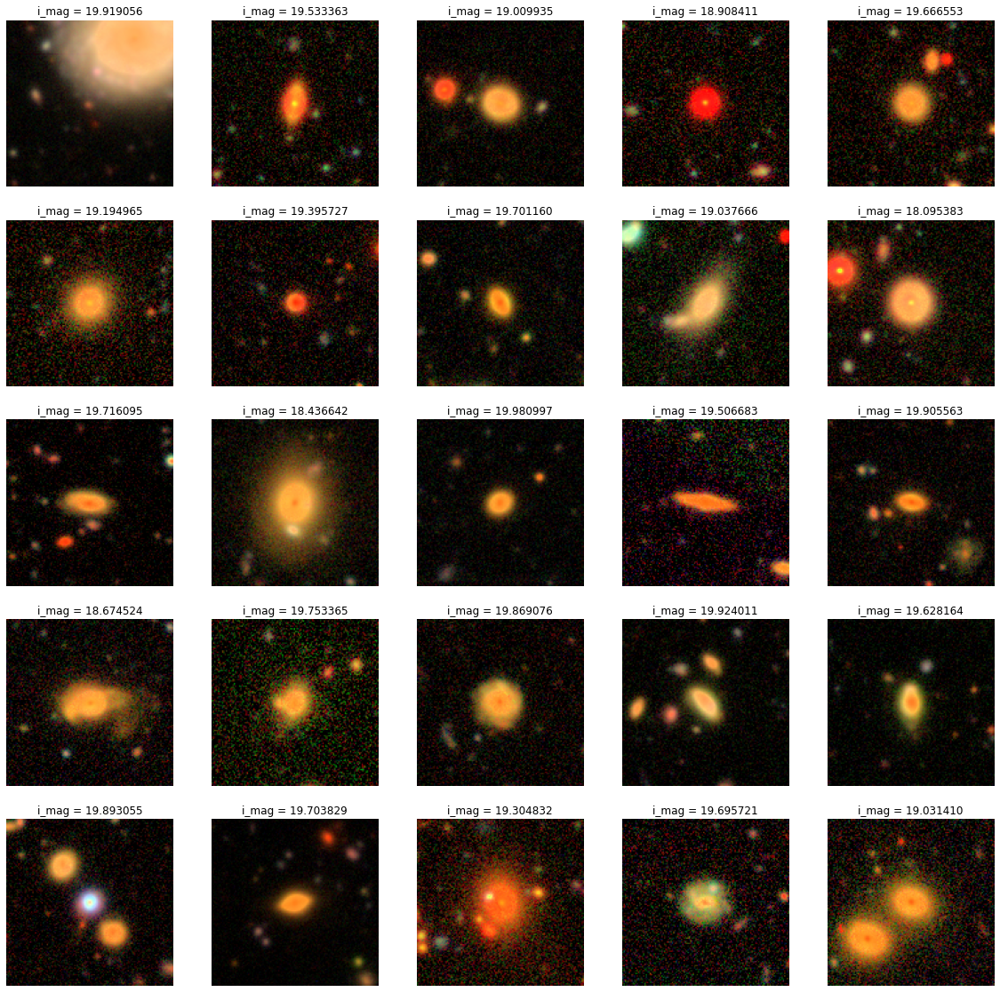

In [ ]:
from astropy.visualization import make_lupton_rgb
%pylab inline 

# The data is in 5 bands GRIZY, but for visualisation we use only the
# 3 first bands and luptonize them
def luptonize(img):
  return make_lupton_rgb(img[:,:,2], img[:,:,1], img[:,:,0],
                         Q=5, stretch=0.3, minimum=0)

plt.figure(figsize=(20,20))
for i, entry in enumerate(hsc_dset.take(25)):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(entry['image']))
  #plt.title('ID = %d'%entry['object_id'])
  plt.title('i_mag = %f'%entry['attrs']['i_cmodel_mag'])
  plt.axis('off')

In [ ]:
entry['image'].shape

TensorShape([128, 128, 5])

### Visualise the galaxies in Tidal_dset

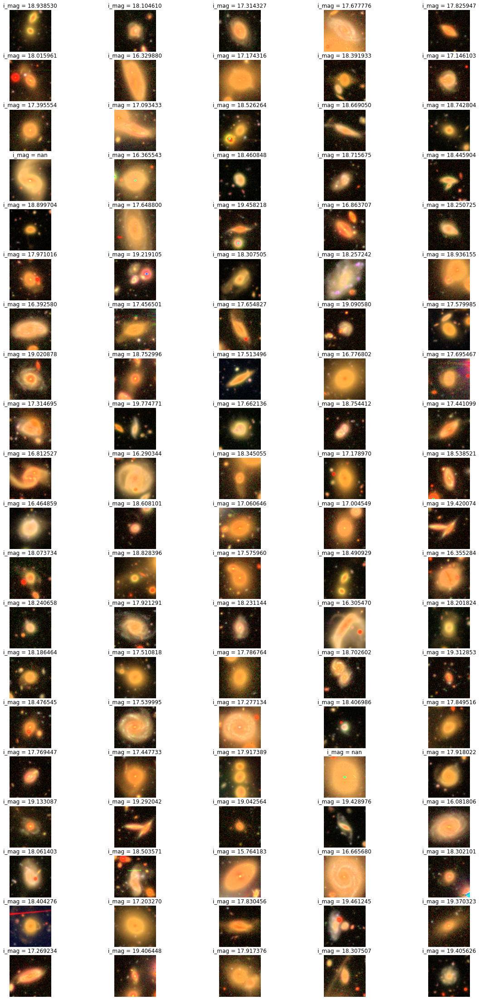

In [ ]:
# Visualise ten galaxies of interest
plt.figure(figsize=(20,40))
i = 0
for i, entry in enumerate(Tidal_dset.take(100)):
  plt.subplot(20,5,i+1)
  plt.imshow(luptonize(entry['image']))
  #plt.title('ID = %d'%entry['object_id'])
  plt.title('i_mag = %f'%entry['attrs']['i_cmodel_mag'])
  plt.axis('off')

## Apply normalization and preprocessing

In [10]:
# Apply normalization to images
# Let's collect a few examples to check their distributions
cutouts=[]
for (batch, entry) in enumerate(hsc_dset.take(1000)):
  cutouts.append(entry['image'])
cutouts = np.stack(cutouts)

from astropy.stats import mad_std
scaling = []

for i,b in enumerate(['g', 'r', 'i', 'z', 'y']):
  sigma = mad_std(cutouts[...,i].flatten())
  scaling.append(sigma)

def preprocessing(example):
  img = tf.math.asinh(example['image'] / tf.constant(scaling,dtype=tf.float32) / 3. )
  # We return the preprocessed images
  return img

def unnormalize(x):
  return tf.math.sinh(x) * tf.constant(scaling,dtype=tf.float32) * 3

normalized_hsc_dset = hsc_dset.map(preprocessing)
normalized_tidal_dset = Tidal_dset.map(preprocessing)


In [11]:
tidal_test_dset_full = normalized_hsc_dset.batch(256)

## Building data augmentation pipeline



In [12]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 100 #og 128
EPOCHS = 50
CROP_TO = 96
SEED = 42

PROJECT_DIM = 2048
LATENT_DIM = 512
WEIGHT_DECAY = 0.0005

In [13]:
import tensorflow_addons as tfa

def flip_random_crop(image):
    # With random crops we also apply horizontal flipping.
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_crop(image, (CROP_TO, CROP_TO, 5))
    return image

def add_noise(x):
    sigma = tf.random.uniform([], minval=0, maxval=0.5)
    x += sigma*tf.random.normal([128,128,5])
    return x

def add_blur(x):
    x = tfa.image.gaussian_filter2d(x, filter_shape=(3,3), sigma=1.)
    return x

def add_g_band_blur(x):
  g_band = x[:,:,0]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma = (0.81-0.74)*(1./0.168)
  sigma = np.random.uniform(low=0, high=sigma)
  g_band_blur = tfa.image.gaussian_filter2d(g_band, filter_shape=(5,5),sigma = sigma)
  to_stack = [g_band_blur,x[:,:,1],x[:,:,2],x[:,:,3],x[:,:,4]]
  x=tf.stack(to_stack,axis = 2)
  return x

def add_r_band_blur(x):
  r_band = x[:,:,1]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma = (0.81-0.74)*(1./0.168)
  sigma = np.random.uniform(low=0, high=sigma)
  r_band_blur = tfa.image.gaussian_filter2d(r_band, filter_shape=(5,5),sigma = sigma)
  to_stack = [x[:,:,0],r_band_blur,x[:,:,2],x[:,:,3],x[:,:,4]]
  x=tf.stack(to_stack,axis = 2)
  return x

def add_i_band_blur(x):
  i_band = x[:,:,2]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma = (0.81-0.62)*(1./0.168)
  sigma = np.random.uniform(low=0, high=sigma)
  i_band_blur = tfa.image.gaussian_filter2d(i_band, filter_shape=(5,5),sigma = sigma)
  to_stack = [x[:,:,0],x[:,:,1],i_band_blur,x[:,:,3],x[:,:,4]]
  x=tf.stack(to_stack,axis = 2)
  return x

def add_z_band_blur(x):
  z_band = x[:,:,3]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma = (0.81-0.63)*(1./0.168)
  sigma = np.random.uniform(low=0, high=sigma)
  z_band_blur = tfa.image.gaussian_filter2d(z_band, filter_shape=(5,5),sigma = sigma)
  to_stack = [x[:,:,0],x[:,:,1],x[:,:,2],z_band_blur,x[:,:,4]]
  x=tf.stack(to_stack,axis = 2)
  return x

def add_y_band_blur(x):
  y_band = x[:,:,4]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma = (0.81-0.71)*(1./0.168)
  sigma = np.random.uniform(low=0, high=sigma)
  y_band_blur = tfa.image.gaussian_filter2d(y_band, filter_shape=(5,5),sigma = sigma)
  to_stack = [x[:,:,0],x[:,:,1],x[:,:,2],x[:,:,3],y_band_blur]
  x=tf.stack(to_stack,axis = 2)
  return x
'''
def add_all_band_blur(x):
  [r_band,i_band,z_band,y_band] = [x[:,:,1],x[:,:,2],x[:,:,3],x[:,:,4]]
  # sigma = (g band seeing - i band seeing) converted to pixels
  sigma_r = (0.81-0.74)*(1./0.168)
  sigma_i = (0.81-0.62)*(1./0.168)
  sigma_z = (0.81-0.63)*(1./0.168)
  sigma_y = (0.81-0.71)*(1./0.168)
  r_band_blur = tfa.image.gaussian_filter2d(r_band, filter_shape=(5,5),sigma = sigma_r)
  i_band_blur = tfa.image.gaussian_filter2d(i_band, filter_shape=(5,5),sigma = sigma_i)
  z_band_blur = tfa.image.gaussian_filter2d(z_band, filter_shape=(5,5),sigma = sigma_z)
  y_band_blur = tfa.image.gaussian_filter2d(y_band, filter_shape=(5,5),sigma = sigma_y)
  to_stack = [x[:,:,0],r_band_blur,i_band_blur,z_band_blur,y_band_blur]
  x=tf.stack(to_stack,axis = 2)
  return x
'''

def add_zoom(image):
    zoom_range = tf.random.uniform([],0.9,1.1)
    new_size = [zoom_range*128,zoom_range*128]
    image = tf.image.resize(image,new_size)
    image = tf.image.resize_with_crop_or_pad(image,128,128)
    return image

def random_apply(func, x, p):
    if tf.random.uniform([], minval=0, maxval=1) < p:
        return func(x)
    else:
        return x


def custom_augment(image):
    # As discussed in the SimCLR paper, the series of augmentation
    # transformations (except for random crops) need to be applied
    # randomly to impose translational invariance.
    image = add_zoom(image)
    image = random_apply(add_noise, image, p=0.5)
    #image = random_apply(color_drop, image, p=0.2)
    image = random_apply(add_blur, image, p=0.5)
    #image = random_apply(add_all_band_blur, image, p=0.5)
    image = random_apply(add_g_band_blur, image, p=0.5)
    image = random_apply(add_r_band_blur, image, p=0.5)
    image = random_apply(add_i_band_blur, image, p=0.5)
    image = random_apply(add_z_band_blur, image, p=0.5)
    image = random_apply(add_y_band_blur, image, p=0.5)
    image = flip_random_crop(image)
    return image

Now we create 2 versions of the same dataset so that every image will be based on the same true HSC image, but receive different augmentations:

In [15]:
# Build two versions of the dataset
dset_one = normalized_hsc_dset.shuffle(1024, seed=SEED)
dset_one = dset_one.map(custom_augment, num_parallel_calls=AUTO)
dset_one = dset_one.batch(BATCH_SIZE)
dset_one = dset_one.prefetch(AUTO)

dset_two = normalized_hsc_dset.shuffle(1024, seed=SEED)
dset_two = dset_two.map(custom_augment, num_parallel_calls=AUTO)
dset_two = dset_two.batch(BATCH_SIZE)
dset_two = dset_two.prefetch(AUTO)

In [16]:
# We then zip both of these datasets.
ssl_ds = tf.data.Dataset.zip((dset_one, dset_two))

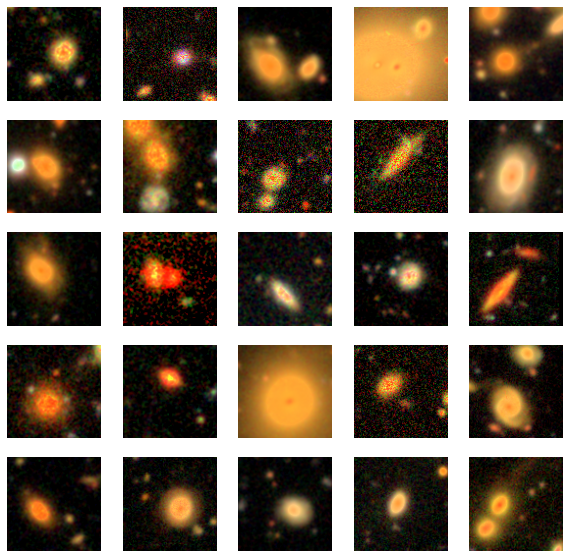

In [ ]:
# Visualize a few augmented images.
sample_images_one = next(iter(dset_one))
plt.figure(figsize=(10, 10))
for n in range(25):
    ax = plt.subplot(5, 5, n + 1)
    plt.imshow(luptonize(unnormalize(sample_images_one[n]).numpy()).astype("int"))
    plt.axis("off")
plt.show()


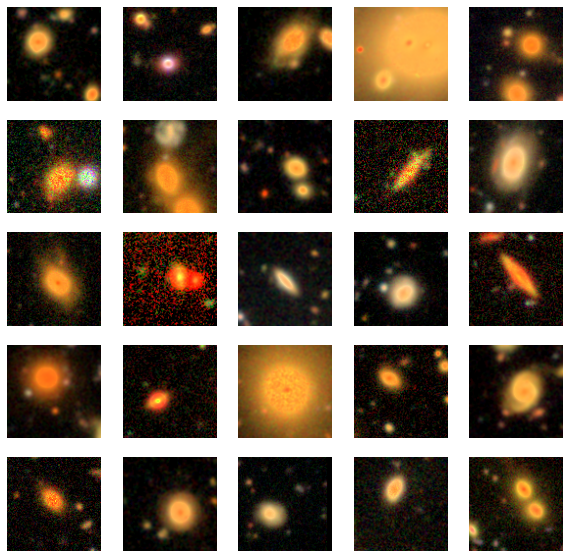

In [ ]:
sample_images_two = next(iter(dset_two))
plt.figure(figsize=(10, 10))
for n in range(25):
    ax = plt.subplot(5, 5, n + 1)
    plt.imshow(luptonize(unnormalize(sample_images_two[n]).numpy()).astype("int"))
    plt.axis("off")
plt.show()

We see that these two sets of images are based on the same true galaxies, but seen under different perturbations.

## Build the networks

Here, as a baseline, we follow the keras example from  https://keras.io/examples/vision/simsiam/

It is based on a resnet 20 network, which is not the biggest one we could imagine, but a good starting point.

In [17]:
!wget -q https://git.io/JYx2x -O resnet_cifar10_v2.py

In [18]:
import resnet_cifar10_v2
import tensorflow.keras.layers as layers
import tensorflow.keras.regularizers as regularizers

N = 2
DEPTH = N * 9 + 2
NUM_BLOCKS = ((DEPTH - 2) // 9) - 1

def get_encoder():
    # Input and backbone.
    inputs = layers.Input((CROP_TO, CROP_TO, 5))
    x = resnet_cifar10_v2.stem(inputs)
    x = resnet_cifar10_v2.learner(x, NUM_BLOCKS)
    x = layers.GlobalAveragePooling2D(name="backbone_pool")(x)

    # Projection head.
    x = layers.Dense(
        PROJECT_DIM, use_bias=False, kernel_regularizer=regularizers.l2(WEIGHT_DECAY)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dense(
        PROJECT_DIM, use_bias=False, kernel_regularizer=regularizers.l2(WEIGHT_DECAY)
    )(x)
    outputs = layers.BatchNormalization()(x)
    return tf.keras.Model(inputs, outputs, name="encoder")


def get_predictor():
    model = tf.keras.Sequential(
        [
            # Note the AutoEncoder-like structure.
            layers.Input((PROJECT_DIM,)),
            layers.Dense(
                LATENT_DIM,
                use_bias=False,
                kernel_regularizer=regularizers.l2(WEIGHT_DECAY),
            ),
            layers.ReLU(),
            layers.BatchNormalization(),
            layers.Dense(PROJECT_DIM),
        ],
        name="predictor",
    )
    return model

This will be our loss function, which computes the similarity between pairs of encoded images:

In [19]:
def compute_loss(p, z):
    # The authors of SimSiam emphasize the impact of
    # the `stop_gradient` operator in the paper as it
    # has an important role in the overall optimization.
    z = tf.stop_gradient(z)
    p = tf.math.l2_normalize(p, axis=1)
    z = tf.math.l2_normalize(z, axis=1)
    # Negative cosine similarity (minimizing this is
    # equivalent to maximizing the similarity).
    return -tf.reduce_mean(tf.reduce_sum((p * z), axis=1))

In [20]:
class SimSiam(tf.keras.Model):
    def __init__(self, encoder, predictor):
        super(SimSiam, self).__init__()
        self.encoder = encoder
        self.predictor = predictor
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")

    @property
    def metrics(self):
        return [self.loss_tracker]

    def train_step(self, data):
        # Unpack the data.
        ds_one, ds_two = data

        # Forward pass through the encoder and predictor.
        with tf.GradientTape() as tape:
            z1, z2 = self.encoder(ds_one), self.encoder(ds_two)
            p1, p2 = self.predictor(z1), self.predictor(z2)
            # Note that here we are enforcing the network to match
            # the representations of two differently augmented batches
            # of data.
            loss = compute_loss(p1, z2) / 2 + compute_loss(p2, z1) / 2

        # Compute gradients and update the parameters.
        learnable_params = (
            self.encoder.trainable_variables + self.predictor.trainable_variables
        )
        gradients = tape.gradient(loss, learnable_params)
        self.optimizer.apply_gradients(zip(gradients, learnable_params))

        # Monitor loss.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

## Training

Epoch 1/50
452/452 [==============================] - 581s 1s/step - loss: -0.9216
Epoch 2/50
452/452 [==============================] - 561s 1s/step - loss: -0.9565
Epoch 3/50
452/452 [==============================] - 561s 1s/step - loss: -0.9754
Epoch 4/50
452/452 [==============================] - 563s 1s/step - loss: -0.9800
Epoch 5/50
452/452 [==============================] - 558s 1s/step - loss: -0.9819
Epoch 6/50
452/452 [==============================] - 557s 1s/step - loss: -0.9827
Epoch 7/50
452/452 [==============================] - 556s 1s/step - loss: -0.9835
Epoch 8/50
452/452 [==============================] - 557s 1s/step - loss: -0.9840
Epoch 9/50
452/452 [==============================] - 559s 1s/step - loss: -0.9847
Epoch 10/50
452/452 [==============================] - 557s 1s/step - loss: -0.9851
Epoch 11/50
452/452 [==============================] - 556s 1s/step - loss: -0.9855
Epoch 12/50
452/452 [==============================] - 556s 1s/step - loss: -0.9862
E

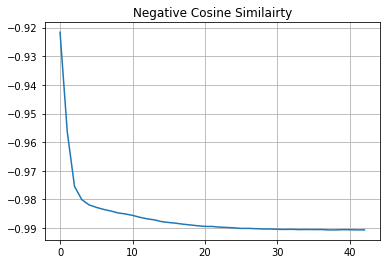

In [ ]:
# Create a cosine decay learning scheduler.
num_training_samples = 45000
steps = EPOCHS * (num_training_samples // BATCH_SIZE)
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=0.03, decay_steps=steps
)

# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="loss", patience=5, restore_best_weights=True
)

# Compile model and start training.
simsiam = SimSiam(get_encoder(), get_predictor())

simsiam.compile(optimizer=tf.keras.optimizers.SGD(lr_decayed_fn, momentum=0.6))

history = simsiam.fit(ssl_ds, epochs=EPOCHS, callbacks=[early_stopping])

# Visualize the training progress of the model.
plt.plot(history.history["loss"])
plt.grid()
plt.title("Negative Cosine Similairty")
plt.show()



### Save the model

In [ ]:
model = simsiam.encoder
model.save("/content/my_model13")

INFO:tensorflow:Assets written to: /content/my_model13/assets


INFO:tensorflow:Assets written to: /content/my_model13/assets


In [ ]:
!gsutil -m -q cp -r /content/my_model13/ gs://ml22/hsc_photoz/my_model13

## Load the saved model

In [21]:
# Create a cosine decay learning scheduler.
num_training_samples = 45000
steps = EPOCHS * (num_training_samples // BATCH_SIZE)
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=0.03, decay_steps=steps
)

# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="loss", patience=5, restore_best_weights=True
)

# Compile model and start training.
simsiam = SimSiam(get_encoder(), get_predictor())

simsiam.compile(optimizer=tf.keras.optimizers.SGD(lr_decayed_fn, momentum=0.6))

In [22]:
%cd /content
!gsutil cp -r gs://ml22/hsc_photoz/my_model13 /content

/content
Copying gs://ml22/hsc_photoz/my_model13/keras_metadata.pb...
Copying gs://ml22/hsc_photoz/my_model13/saved_model.pb...
Copying gs://ml22/hsc_photoz/my_model13/variables/variables.data-00000-of-00001...
Copying gs://ml22/hsc_photoz/my_model13/variables/variables.index...
- [4 files][ 22.3 MiB/ 22.3 MiB]                                                
Operation completed over 4 objects/22.3 MiB.                                     


In [23]:
from tensorflow import keras
simsiam.encoder = keras.models.load_model('/content/my_model13')

In [24]:
simsiam.compile(optimizer=tf.keras.optimizers.SGD(lr_decayed_fn, momentum=0.6))


## Adding a Classifier Layer

## Looking for similarity 


Now that the model is more or less trained, let's see if it is learning a usable representation.

We are going to use its latent representation to compute a similarity score between galaxy examples, and find the most similar ones to a given example.

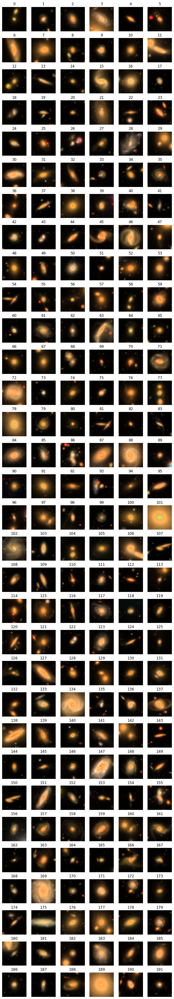

In [55]:
# Let's find a galaxy that we will use to query
ims2 = []
plt.figure(figsize=(10,60))
#for i, entry in enumerate(normalized_hsc_dset.take(25)):
for i, entry in enumerate(Tidal_dset.take(192)):
  plt.subplot(32,6,i+1)
  plt.imshow(luptonize(entry['image']))
  ims2.append(entry['image'])
  plt.title(i)
  plt.axis('off')

In [130]:

# The data is in 5 bands GRIZY, but for visualisation we use only the
# 3 first bands and luptonize them
def luptonize(img):
  return make_lupton_rgb(img[:,:,2], img[:,:,1], img[:,:,0],
                         Q=5, stretch=0.9, minimum=0)

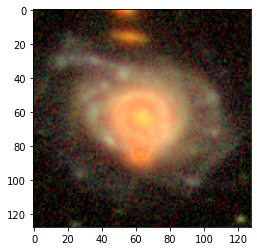

In [29]:
# Ok, so say we want to find more of our favorite galaxy 
#83 80 63 166 43 40 90 98 25 64 117 126
im_ref_num = 117
im_ref = ims2[im_ref_num]
imshow(luptonize((im_ref)))

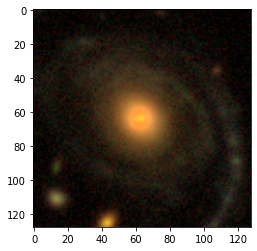

In [118]:
# Ok, so say we want to find more of our favorite galaxy 
#83 80 63 166 43 40 90 98 25 64 117 126
im_ref_num = 158
im_ref = ims2[im_ref_num]
imshow(luptonize((im_ref)))

In [119]:
norm_im_ref = tf.math.asinh(im_ref / tf.constant(scaling,dtype=tf.float32) / 3. )

In [120]:
test_dset = normalized_hsc_dset.map(lambda x: tf.image.central_crop(x, CROP_TO/128.))
test_dset = test_dset.batch(256)

batch_ref = tf.expand_dims(tf.image.central_crop(norm_im_ref, CROP_TO/128.), 0)
#print(batch_ref)

In [121]:
@tf.function
def compute_similarity(p, z):
    p = tf.math.l2_normalize(p, axis=1)
    z = tf.math.l2_normalize(z, axis=1)
    return tf.reduce_sum((p * z), axis=1)

In [122]:
similarity = []
ims = []
for batch in test_dset:
  similarity.append(compute_similarity(simsiam.encoder(batch_ref), simsiam.encoder(batch)))
  ims.append(batch.numpy())
similarity = np.concatenate(similarity)
ims = np.concatenate(ims, axis=0)

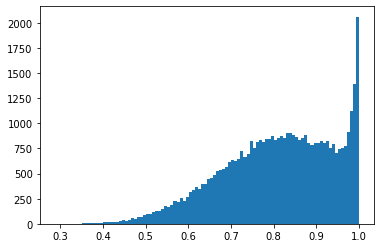

In [123]:
hist(similarity,100);

"\nplt.figure(figsize=(10,10))\nfor i in range(25):\n  plt.subplot(5,5,i+1)\n  plt.imshow(luptonize(unnormalize(ims[inds[i]])))\n  if i ==0:\n    title('reference')\n  plt.axis('off')\n"

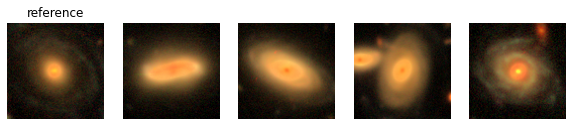

In [124]:
# Looking at the 25 most similar galaxies
inds = argsort(similarity)[::-1]

plt.figure(figsize=(10,10))
for i in range(5):
  plt.subplot(1,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  if i ==0:
    title('reference')
  plt.axis('off')

'''
plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  if i ==0:
    title('reference')
  plt.axis('off')
'''

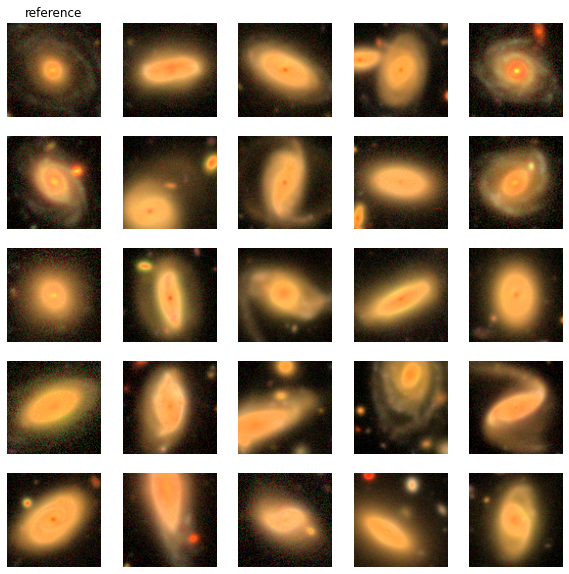

In [129]:
plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  if i ==0:
    title('reference')
  plt.axis('off')


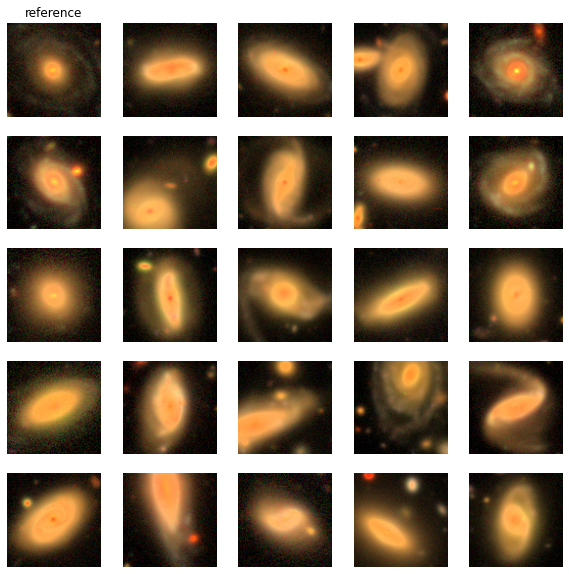

In [131]:
plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  if i ==0:
    title('reference')
  plt.axis('off')


In [ ]:
# Find where in the array of images the objects of interest are
# int_inds_by_sim = array of indices of interesting objects in ims ranked by similarity - i.e there is a known interesting object at ims[i]
# pos_in_sim = position of the object in inds - i.e. object is the nth most similar
j=0
int_inds_by_sim = []
pos_in_sim = []
k=0
for i in range(45000):
  if j < 189:
    k+=1
    if inds[i] in int_inds:
      int_inds_by_sim.append(inds[i])
      pos_in_sim.append(i)
      j+=1
print(k)
print(j)
print(int_inds_by_sim)

29858
189
[14991, 44545, 7474, 10215, 28737, 8872, 23111, 22873, 5551, 35446, 2598, 21456, 25181, 248, 4187, 27711, 39981, 22894, 22510, 18054, 33770, 17982, 654, 42889, 16246, 4711, 8885, 41437, 36127, 20437, 24025, 11014, 41024, 1277, 36957, 20428, 32879, 36671, 30363, 5770, 34839, 21809, 42734, 35213, 12184, 41765, 26850, 5784, 24209, 25569, 753, 12953, 10968, 9649, 41923, 28707, 9223, 5754, 41856, 38126, 33181, 33102, 2394, 33614, 26764, 7368, 41238, 14341, 3441, 11938, 8742, 17455, 38410, 41676, 21482, 30439, 5166, 11486, 12297, 43027, 19518, 29698, 24138, 8402, 9982, 33114, 19067, 20181, 21832, 26581, 8703, 13848, 39198, 38595, 43963, 26518, 8305, 15649, 21796, 36553, 12381, 16451, 34780, 28054, 21590, 37519, 15902, 29812, 16373, 8619, 1956, 38361, 37, 7435, 13277, 16697, 18656, 8130, 24256, 33276, 39151, 22441, 5831, 16218, 21330, 30383, 17673, 28295, 35369, 23574, 20938, 1112, 5454, 11856, 37576, 11803, 28762, 14208, 44202, 40371, 41474, 14965, 35777, 1461, 4967, 8312, 35403, 5

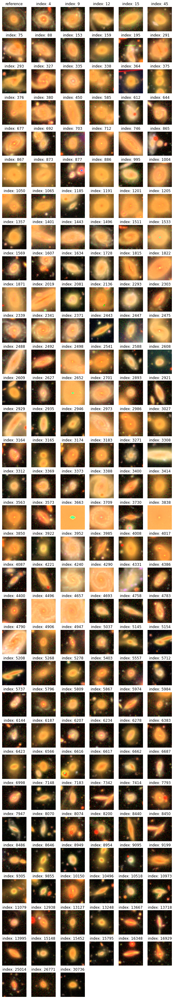

In [ ]:
plt.figure(figsize=(10,60))
for i in range(189):
  plt.subplot(32,6,i+1)
  plt.imshow(luptonize(unnormalize(ims[int_inds_by_sim[i]])))
  if i ==0:
    title('reference')
  else:
    title('index: %d' %pos_in_sim[i])
  plt.axis('off')

Text(0.5, 1.0, 'Similarity Ranking Histogram for im_ref_64')

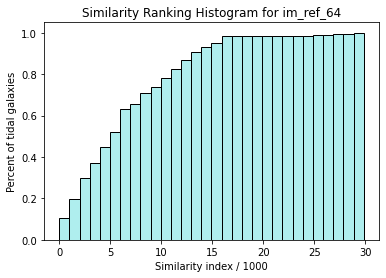

In [ ]:
import matplotlib.colors as mcolors
pos_in_sim_norm = []
for num in pos_in_sim:
  pos_in_sim_norm.append(num/1000)

plt.figure()
hist(pos_in_sim_norm,30,density=True,edgecolor = 'black', facecolor='paleturquoise', cumulative=True);
plt.xlabel("Similarity index / 1000")
plt.ylabel("Percent of tidal galaxies")
plt.title("Similarity Ranking Histogram for im_ref_%d"%im_ref_num)

IndexError: ignored

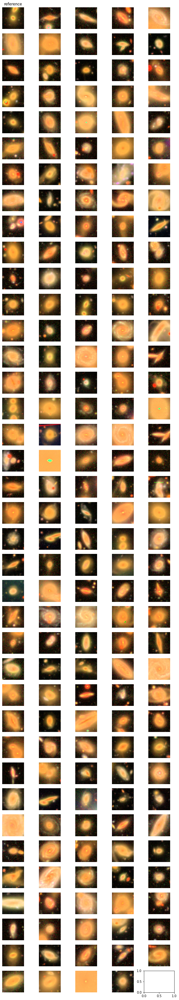

In [ ]:
  # Do the indices of interesting galaxies in hsc_dset match those in ims

plt.figure(figsize=(10,60))
for i in range(192):
  plt.subplot(40,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[int(int_inds[i])])))
  if i ==0:
    title('reference')
  plt.axis('off')

In [ ]:
ims_full = []
for batch in tidal_test_dset_full.take(40):
  ims_full.append(batch.numpy())
ims_full = np.concatenate(ims_full, axis=0)

## Make a Similarity Histogram

Make a similarity histogram for each of the galaxies in tidal_ims3 against every other galaxy in tidal_ims3

In [ ]:
from astropy.table import Table
cata = Table.read('/content/Tidal.fits')

In [ ]:
tidal_test_dset = normalized_tidal_dset.map(lambda x: tf.image.central_crop(x, CROP_TO/128.))
tidal_test_dset = tidal_test_dset.batch(192)

tidal_batch_ref = tf.expand_dims(tf.image.central_crop(norm_im_ref, CROP_TO/128.), 0)

In [ ]:
similarity1 = []
ims1 = []

for entry in normalized_tidal_dset:
  tidal_batch_ref = tf.expand_dims(tf.image.central_crop(entry, CROP_TO/128.), 0)
  for batch in tidal_test_dset:
    similarity1.append(compute_similarity(simsiam.encoder(tidal_batch_ref), simsiam.encoder(batch)))
ims1.append(batch.numpy)
similarity1 = np.concatenate(similarity1)
#ims1 = np.concatenate(ims1, axis=0)

In [ ]:
i = 0
similarity1 = []
for entry in batch1:
  similarity1.append(compute_similarity(simsiam.encoder(entry), simsiam.encoder(batch1)))
similarity1 = np.concatenate(similarity1)

In [ ]:
similarity1 = []
ims1 = []

for i, entry in enumerate(tidal_ims3.keys()):
  if i >= 150:
    im1 = tidal_ims3[entry]['image']
    im1_norm = tf.math.asinh(im1 / tf.constant(scaling,dtype=tf.float32) / 3. )
    im1_crop = tf.expand_dims(tf.image.central_crop(im1_norm, CROP_TO/128.), 0)
    for entries in tidal_ims3.keys():
      im2 = tidal_ims3[entries]['image']
      im2_norm = tf.math.asinh(im2 / tf.constant(scaling,dtype=tf.float32) / 3. )
      im2_crop = tf.expand_dims(tf.image.central_crop(im2_norm, CROP_TO/128.), 0)
      similarity1.append(compute_similarity(simsiam.encoder(im1_crop), simsiam.encoder(im2_crop)))
similarity1 = np.concatenate(similarity1)
#ims1 = np.concatenate(ims1, axis=0)

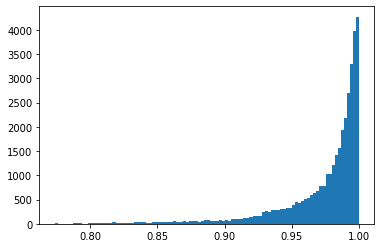

In [ ]:
hist(similarity1,100);

In [ ]:
shape(similarity1)

(192,)

In [ ]:
# Looking at the 25 most similar galaxies
inds = argsort(similarity)[::-1]

plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  if i ==0:
    title('reference')
  plt.axis('off')

In [ ]:
# Looking at the 25 most similar galaxies
inds = argsort(similarity)[::-1]

plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.imshow(luptonize(unnormalize(ims[inds[i]])))
  plt.axis('off')

In [25]:
print(tf.__version__)

2.8.0
